In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from bokeh.palettes import brewer, Set1
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, Circle, HoverTool, CustomJS, Range1d, Slider, FactorRange, Label, LabelSet

from bokeh.io import output_notebook, show
output_notebook()

/Users/anyiwang/miniforge3/envs/basic_env/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Loading BokehJS ...

### Preprocessing

In [17]:
df = pd.read_csv('AgeDataset-V1.csv')

In [15]:
for col in df.columns:
    print(col, ': ', len(df[col].unique()))

Id :  1222997
Name :  1130871
Short description :  512440
Gender :  21
Country :  5962
Occupation :  9314
Birth year :  2173
Death year :  2254
Manner of death :  207
Age of death :  131


In [16]:
df['Gender'].unique()

array(['Male', 'Female', nan, 'Transgender Female', 'Intersex',
       'Transgender Person; Intersex; Transgender Male', 'Non-Binary',
       'Eunuch; Male', 'Transgender Male', 'Eunuch', 'Intersex; Male',
       'Transgender Female; Female', 'Transgender Female; Male',
       'Female; Male', 'Intersex; Transgender Male',
       'Transgender Male; Female', 'Transgender Male; Male',
       'Intersex; Female', 'Transgender Female; Intersex',
       'Female; Female', 'Non-Binary; Intersex'], dtype=object)

In [18]:
df.isnull().sum()

Id                         0
Name                       0
Short description      67900
Gender                133646
Country               335509
Occupation            206914
Birth year                 0
Death year                 1
Manner of death      1169406
Age of death               1
dtype: int64

In [18]:
## grouping manner of death
manner_of_death = df[df['Manner of death'].notna()]

manner_of_death['additional info on death'] = manner_of_death.apply(lambda row: row['Manner of death'].split(';')[1:] if len(row['Manner of death'].split(';')) > 1 else row['Manner of death'], 
                                            axis=1)
manner_of_death['Manner of death'] = manner_of_death.apply(lambda row: row['Manner of death'].split(';')[0], 
                                            axis=1)

manner_of_death['Manner of death'].value_counts().to_dict()

/var/folders/xn/qxjmq8hj3ps62r2dfnf5s0nm0000gn/T/ipykernel_2262/823061889.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  manner_of_death['additional info on death'] = manner_of_death.apply(lambda row: row['Manner of death'].split(';')[1:] if len(row['Manner of death'].split(';')) > 1 else row['Manner of death'],
/var/folders/xn/qxjmq8hj3ps62r2dfnf5s0nm0000gn/T/ipykernel_2262/823061889.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  manner_of_death['Manner of death'] = manner_of_death.apply(lambda r

{'natural causes': 33533,
 'suicide': 5875,
 'accident': 5080,
 'homicide': 4732,
 'capital punishment': 3589,
 'unnatural death': 309,
 'death in battle': 250,
 'war': 9,
 'extrajudicial killing': 9,
 'Eastern Front of World War II': 8,
 'duel': 8,
 'shipwrecking': 7,
 'euthanasia': 6,
 'unfortunate accident': 5,
 'lynching': 5,
 'torture': 5,
 'ballistic trauma': 4,
 'dogfight': 4,
 'femicide': 4,
 'falling': 4,
 'Whitechapel murders': 4,
 'summary execution': 4,
 'complication': 4,
 'Israeli targeted killings': 3,
 'World War I': 3,
 'gunshot': 3,
 'deportation': 3,
 'pending investigation': 3,
 'death by misadventure': 3,
 'disaster': 2,
 'aerial warfare': 2,
 'prisoner': 2,
 'deliberate murder': 2,
 'The Holocaust': 2,
 'torpedo': 2,
 'unlawful killing': 2,
 'work accident': 2,
 'cholera outbreak': 2,
 'dysentery': 2,
 'hunger strike': 2,
 'public execution': 2,
 'Spanish Civil War': 2,
 'missing person': 1,
 'manslaughter': 1,
 'armed robbery': 1,
 'combat': 1,
 'aerial bomb': 1,

In [19]:
replace_dict = {
                'extrajudicial killing':'homicide',
                'Eastern Front of World War II': 'war',
               'shipwrecking':'accident', 'unfortunate accident':'accident',
               'femicide':'homicide', 
               'World War I':'war', 'Whitechapel murders':'homicide',
               'Spanish Civil War':'war', 'assisted suicide':'suicide', 
               'Bombing of Berlin in World War II':'war',
                'death in battle':'war',
                'unnatural death':'others'
               }

manner_of_death = manner_of_death.replace({'Manner of death':replace_dict})


## remove count < 100
# count_small = [key for key, val in manner_count_dict.items() if val < 100]
# manner_of_death = manner_of_death.drop(manner_of_death[manner_of_death['Manner of death'].isin(count_one)].index)

## categorising small counts as others (should unnatural death be others too?)
manner_dict = manner_of_death['Manner of death'].value_counts().to_dict()
replace_dict_small = {key:'others' for key,value in manner_dict.items() if value < 100}
manner_of_death = manner_of_death.replace({'Manner of death':replace_dict_small})

manner_of_death['Manner of death'].value_counts().to_dict()

{'natural causes': 33533,
 'suicide': 5876,
 'accident': 5092,
 'homicide': 4749,
 'capital punishment': 3589,
 'others': 491,
 'war': 273}

### Occupations

In [20]:
occupations = manner_of_death[['Occupation', 'Death year', 'Manner of death', 'Age of death']].dropna()
top_10 = occupations.groupby(['Occupation']).size().reset_index(name='Count').sort_values('Count', ascending = False).head(10)['Occupation'].tolist()
occupations_10 = occupations[occupations['Occupation'].isin(top_10)][['Occupation', 'Manner of death']]

# restructure df
occupations_10 = occupations_10.groupby(['Occupation', 'Manner of death']).size().reset_index(name = 'count')
occupations_10 = occupations_10.pivot(index=['Occupation'], columns = ['Manner of death'], values='count')

In [21]:
occupations_10 = occupations_10.fillna(0)
occupations_10['total'] = occupations_10.sum(axis=1)
occupations_10['occupation'] = occupations_10.index.tolist()
occupations_10 = occupations_10.reset_index(drop=True)
occupations_10.columns.name = ''
occupations_10.index = occupations_10['occupation'].tolist()
occupations_10 = occupations_10.drop('occupation', axis=1)
for col in occupations_10.columns.to_list():
    occupations_10[col] = occupations_10.apply(lambda row: row[col]/row['total'] , axis=1)
    
occupations_10 = occupations_10.drop(['total'], axis=1)
occupations_10 = occupations_10.drop(['Teacher', 'Athlete', 'Businessperson', 'Politician', 'Researcher'], axis=0)

occupations_10

,accident,capital punishment,homicide,natural causes,others,suicide,war
Artist,0.068711,0.013318,0.033692,0.767125,0.005359,0.111052,0.000743
Engineer,0.173127,0.025840,0.062016,0.607235,0.015504,0.113695,0.002584
Journalist,0.058325,0.021637,0.170273,0.651929,0.003763,0.086548,0.007526
Military personnel,0.185128,0.174396,0.113837,0.318130,0.024914,0.140284,0.043312
Religious figure,0.048220,0.163031,0.183697,0.580941,0.010333,0.013777,0.000000


In [24]:
order = occupations_5.groupby('Occupation').agg('mean').sort_values('Age of death').index.tolist()

In [23]:
occupations = manner_of_death[['Occupation','Age of death']].dropna()
top_5 = ['Artist', 'Engineer', 'Journalist', 'Military personnel', 'Religious figure']

# restructure df
occupations_5 = occupations[occupations['Occupation'].isin(top_5)]
occupations_5

,Occupation,Age of death
1,Artist,49.0
7,Artist,86.0
10,Artist,42.0
20,Artist,53.0
21,Artist,36.0
...,...,...
1217823,Artist,39.0
1217919,Artist,37.0
1219866,Artist,36.0
1222916,Artist,47.0


In [25]:
data = []
for c in order:
    data.append(occupations_5[occupations_5['Occupation'] == c]['Age of death'].tolist())
        
colors = n_colors('rgb(5, 10, 10)', 'rgb(200, 10, 10)', 5, colortype='rgb')

fig = go.Figure()
fig.update_layout(width=800, height=800)
fig.update_xaxes(title='Age of death')
    
for data_line, color, name in zip(data, colors, order):
    fig.add_trace(go.Violin(x=data_line, line_color=color, name=name, meanline_visible=True))

fig.update_traces(orientation='h', side='positive', width=3, points=False)
fig.update_layout(xaxis_showgrid=False, xaxis_zeroline=False)
fig.show()

NameError: name 'n_colors' is not defined

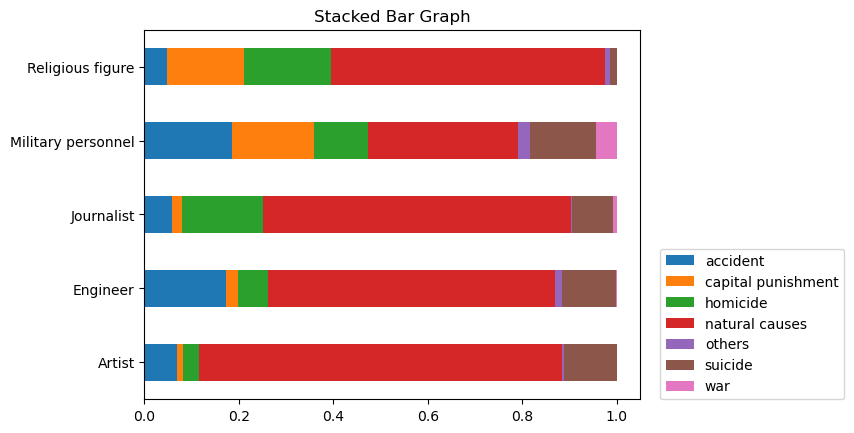

In [29]:
# fig = plt.figure()
# ax = plt.subplot(111)

occupations_10.plot( 
    kind = 'barh',
    stacked = True,
    title = 'Stacked Bar Graph',
    mark_right = True)

plt.legend(loc=(1.04, 0))

# # Shrink current axis by 20%
# box = ax.get_position()
# ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# # Put a legend to the right of the current axis
# ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))



<AxesSubplot:title={'center':'Stacked Bar Graph'}>

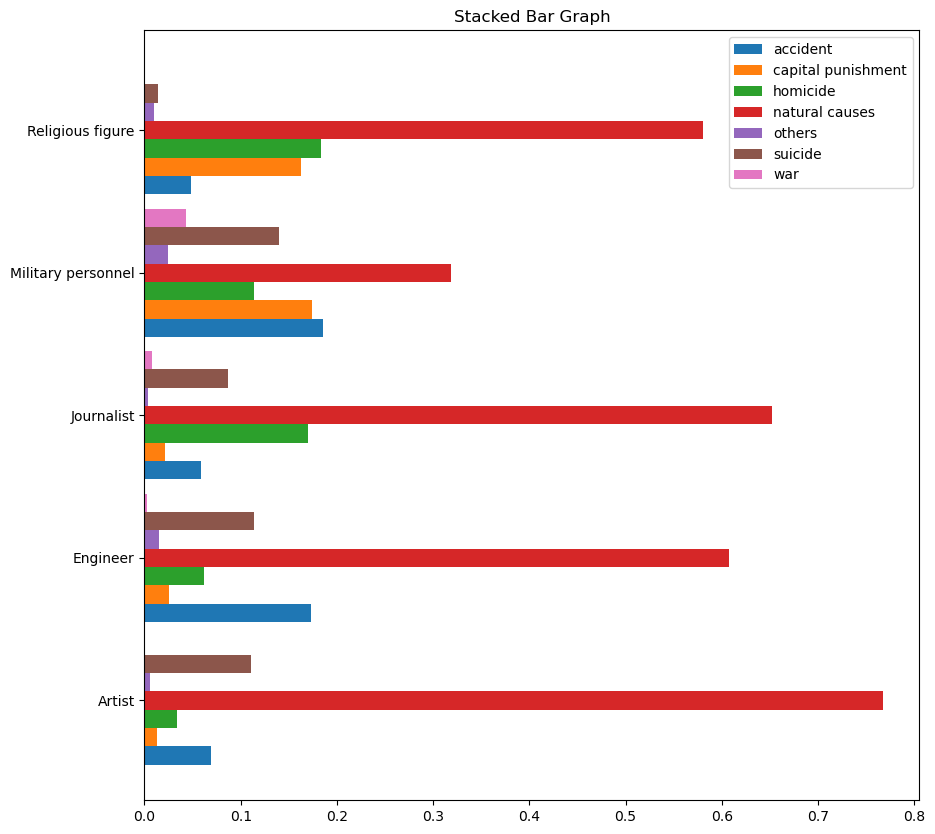

In [30]:
plt.rcParams["figure.figsize"] = (10,10)
occupations_10.plot( 
    kind = 'barh',
    stacked = False,
    title = 'Stacked Bar Graph',
    mark_right = True,
    width=0.9)

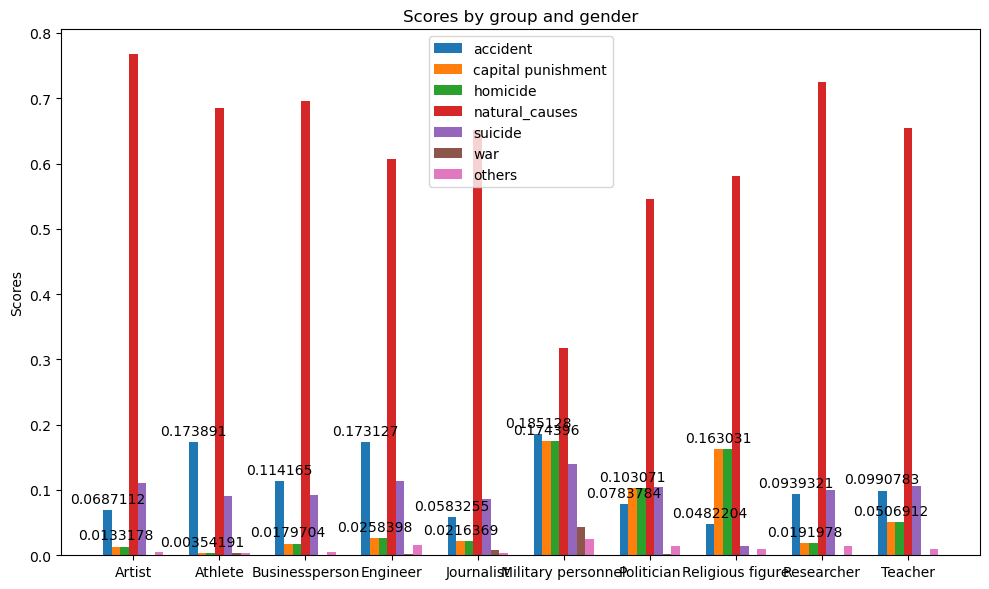

In [381]:
# grouped bar chart
plt.rcParams["figure.figsize"] = (10,6)

labels = occupations_10.index.tolist()
accident = occupations_10['accident'].tolist()
capital_punishment = occupations_10['capital punishment'].tolist()
homicide = occupations_10['homicide'].tolist()
natural_causes = occupations_10['natural causes'].tolist()
suicide = occupations_10['suicide'].tolist()
war = occupations_10['war'].tolist()
others = occupations_10['others'].tolist()

x = np.arange(len(labels))  # the label locations
width = 0.1  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - 3*width, accident, width, label='accident')
rects2 = ax.bar(x - 2*width, capital_punishment, width, label='capital punishment')
rects3 = ax.bar(x - width, capital_punishment, width, label='homicide')
rects4 = ax.bar(x, natural_causes, width, label='natural_causes')
rects5 = ax.bar(x + width, suicide, width, label='suicide')
rects6 = ax.bar(x + 2*width, war, width, label='war')
rects7 = ax.bar(x + 3*width, others, width, label='others')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Scores by group and gender')
ax.set_xticks(x, labels)
ax.legend()

ax.bar_label(rects1, padding=3)
ax.bar_label(rects2, padding=3)

fig.tight_layout()

plt.show()

### Gender

In [670]:
gender = df[df['Gender'].notnull()]
gender['Gender'].value_counts()

Male                                              981365
Female                                            107830
Transgender Female                                    79
Transgender Male                                      36
Eunuch; Male                                          18
Intersex                                               7
Female; Male                                           7
Eunuch                                                 3
Transgender Male; Female                               3
Intersex; Female                                       2
Non-Binary                                             2
Intersex; Male                                         2
Transgender Female; Male                               2
Female; Female                                         1
Transgender Female; Intersex                           1
Transgender Female; Female                             1
Transgender Male; Male                                 1
Intersex; Transgender Male     

In [279]:
gender_replace_dict = {'Eunuch; Male':'Male', 'Transgender Male; Female':'Transgender Male',
                      'Transgender Female; Male':'Transgender Female', 'Female; Female':'Female',
                      'Transgender Person; Intersex; Transgender Male':'Transgender Male'}
gender.replace({'Gender':gender_replace_dict},inplace=True)
mainstream_genders = ['Male','Female', 'Transgender Male','Transgender Female']
gender = gender[gender['Gender'].isin(mainstream_genders)]
gender['Gender'].value_counts()

/var/folders/xn/qxjmq8hj3ps62r2dfnf5s0nm0000gn/T/ipykernel_23322/3095133076.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Male                  981383
Female                107831
Transgender Female        81
Transgender Male          40
Name: Gender, dtype: int64

In [673]:
print(gender[gender['Gender'] == 'Male']['Age of death'].median())
print(gender[gender['Gender'] == 'Female']['Age of death'].median())
print(gender[gender['Gender'] == 'Transgender Male']['Age of death'].median())
print(gender[gender['Gender'] == 'Transgender Female']['Age of death'].median())

72.0
76.0
60.0
48.0


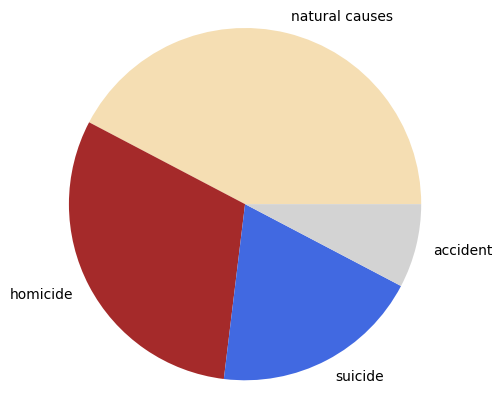

In [692]:
transgender_female = gender[gender['Gender'] == 'Transgender Female'][['Manner of death']].dropna()
transgender_female = transgender_female.replace({'homicide; homicide':'homicide'})
transfemale_dict = transgender_female['Manner of death'].value_counts().to_dict()
labels = list(transfemale_dict.keys())
values = list(transfemale_dict.values())

# transgender_female.plot( 
#     kind = 'barh',
#     stacked = True,
#     title = 'Stacked Bar Graph',
#     mark_right = True)
colors = ( "wheat", "brown", "royalblue","lightgrey")

plt.pie(values, labels=labels, colors=colors)


plt.axis('equal')
plt.show()

<AxesSubplot:xlabel='Gender_type', ylabel='Age of death'>

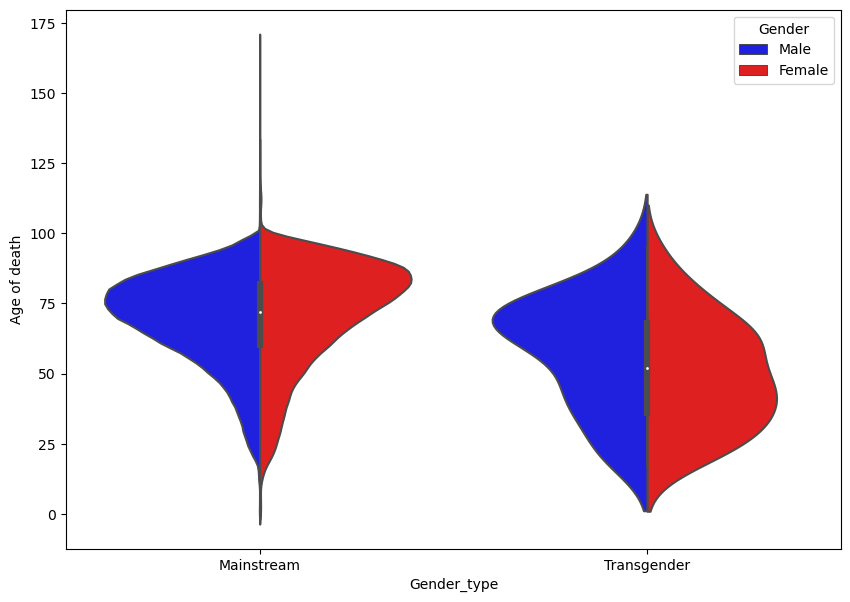

In [389]:
gender_violin = gender.copy()
gender_violin['Gender_type'] = gender_violin.apply(lambda row: 'Mainstream' if row['Gender'] in ["Male", "Female"]
                                                else 'Transgender', axis=1)
gender_violin['Gender'] = gender_violin.apply(lambda row: 'Female' if row['Gender'] in ["Transgender Female", "Female"]
                                                else 'Male', axis=1)
fig, ax = plt.subplots(figsize =(10, 7))
sns.violinplot(data=gender_violin, x='Gender_type', y="Age of death", split=True, hue='Gender', palette=['blue', 'red'])
# plt.hlines(x=4, ymin=0, ymax=250, colors='r', ls='--', lw=2)

In [ ]:
age_df = gender[['Gender', 'Death year', 'Age of death']].dropna().sort_values('Death year', ascending=True)

# life expectancy over time (from the 1500s)
age_df = age_df[age_df['Death year'] >= 1500]

female_df = age_df[age_df['Gender'] == 'Female']
female_df = female_df.groupby('Death year').agg('mean')
smoothed_age_f = female_df.rolling(window = 15, center=True, win_type='gaussian').mean(std=8)

male_df = age_df[age_df['Gender'] == 'Male']
male_df = male_df.groupby('Death year').agg('mean')
smoothed_age_m = male_df.rolling(window = 10, center=True, win_type='gaussian').mean(std=8)

## hover over line
hover_df = pd.DataFrame(data={'year':female_df.index.to_list()
                              , 'female':smoothed_age_f['Age of death'], 'male': smoothed_age_m['Age of death']})
source = ColumnDataSource(hover_df)

TOOLTIPS = [('male', '@{male}{0.0}'), ('female', '@{female}{0.0}'), ('year', '@{year}{0}')]
hover = HoverTool(names=['male_h'])


p = figure(plot_width=1000, plot_height=800, title="Mean life expectancy", x_axis_label='Year', y_axis_label='Age of death (mean)'
        , tools=[hover], tooltips=TOOLTIPS)
p.y_range = Range1d(0, 80)

p.line(x='year', y='female'
       , line_width=2, color='red', legend='Female', name='male_h', source=source)
p.line(x='year', y='male'
       , line_width=2, color='blue', legend='Male', name='male_h', source=source)

## unsmoothed data
# p.line(female_df.index.to_list(), female_df['Age of death'].to_list()
#        , line_width=2, color='red', alpha=0.2)
# p.line(male_df.index.to_list(), male_df['Age of death'].to_list()
#        , line_width=2, color='blue', alpha=0.2)


# # Add a circle, that is visible only when selected
# source = ColumnDataSource({'x': female_df.index.to_list(), 'female': smoothed_age_f['Age of death'], 
#                           'male': smoothed_age_m['Age of death']})
# invisible_circle = Circle(x='x', y='female', fill_color='red', fill_alpha=0.05, line_color=None, size=10)
# visible_circle = Circle(x='x', y='female', fill_color='firebrick', fill_alpha=0.5, line_color=None, size=10)
# cr = p.add_glyph(source, invisible_circle, selection_glyph=visible_circle, nonselection_glyph=invisible_circle)

# # Add a hover tool, that selects the circle
# code = "source.set('selected', cb_data['index']);"
# callback = CustomJS(args={'source': source}, code=code)
# p.add_tools(HoverTool(tooltips=None, callback=callback, renderers=[cr], mode='hline'))


ww1 = p.vbar(x=[1916], width=4, bottom=0, top=[80], color='firebrick', alpha=0.3, muted_alpha=0.0, legend_label='WW1')
ww1.muted=True
ww2 = p.vbar(x=[1942], width=6, bottom=0, top=[80], color='firebrick', alpha=0.3, muted_alpha=0.0, legend_label='WW2')
ww2.muted=True

p.legend.click_policy="mute"
p.legend.location="top_left"

show(p)

### Countries

#### using supplementary dataset

In [290]:
life_exp = pd.read_csv('Life Expectancy Data.csv')
life_exp_trimmed = life_exp[['Country', 'Year', 'Status', 'Life expectancy ']]

In [295]:
def plot_map(df, col, pal):
    df = df[df[col]>0]
    fig = px.choropleth(df, locations="Country", locationmode='country names', 
                  color=col, hover_name="Country", 
                  title=col, hover_data=[col], color_continuous_scale=pal)
#     fig.update_layout(coloraxis_showscale=False)
    fig.show()

In [773]:
# Over the time
fig = px.choropleth(life_exp_trimmed, locations="Country", 
                    color="Life expectancy ",
                    locationmode='country names', hover_name="Country", 
                    animation_frame="Year",
                    title='Life expectancy', color_continuous_scale="BuPu",
                           range_color=(50, 90))
fig.update(layout_coloraxis_showscale=True)
fig.show()

<AxesSubplot:>

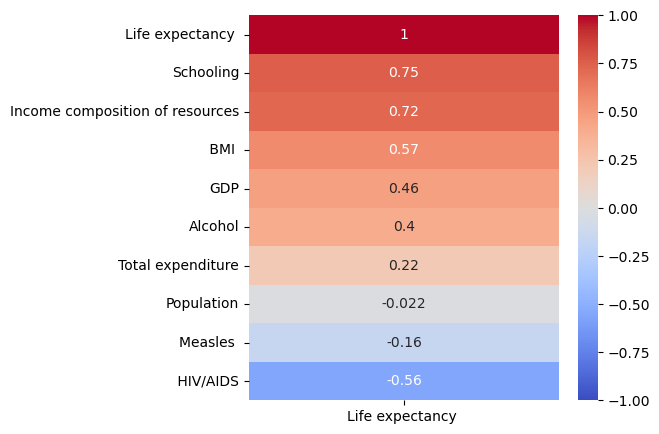

In [698]:
# life_exp['GDPperCap'] = life_exp.apply(lambda row: row['GDP']/row['Population'], axis=1)
life_exp_heatmap = life_exp.drop(['Diphtheria ', 'Polio', ' thinness 5-9 years',
                                 ' thinness  1-19 years', 'Year', 'GDPperCap', 'Hepatitis B', 'percentage expenditure',
                                 'Adult Mortality', 'infant deaths', 'under-five deaths '], axis=1)
sns.heatmap(
    life_exp_heatmap.corr(method='pearson')[['Life expectancy ']].sort_values(by='Life expectancy ',ascending=False),
    annot=True,
    vmin=-1, vmax=1,
    cmap='coolwarm')

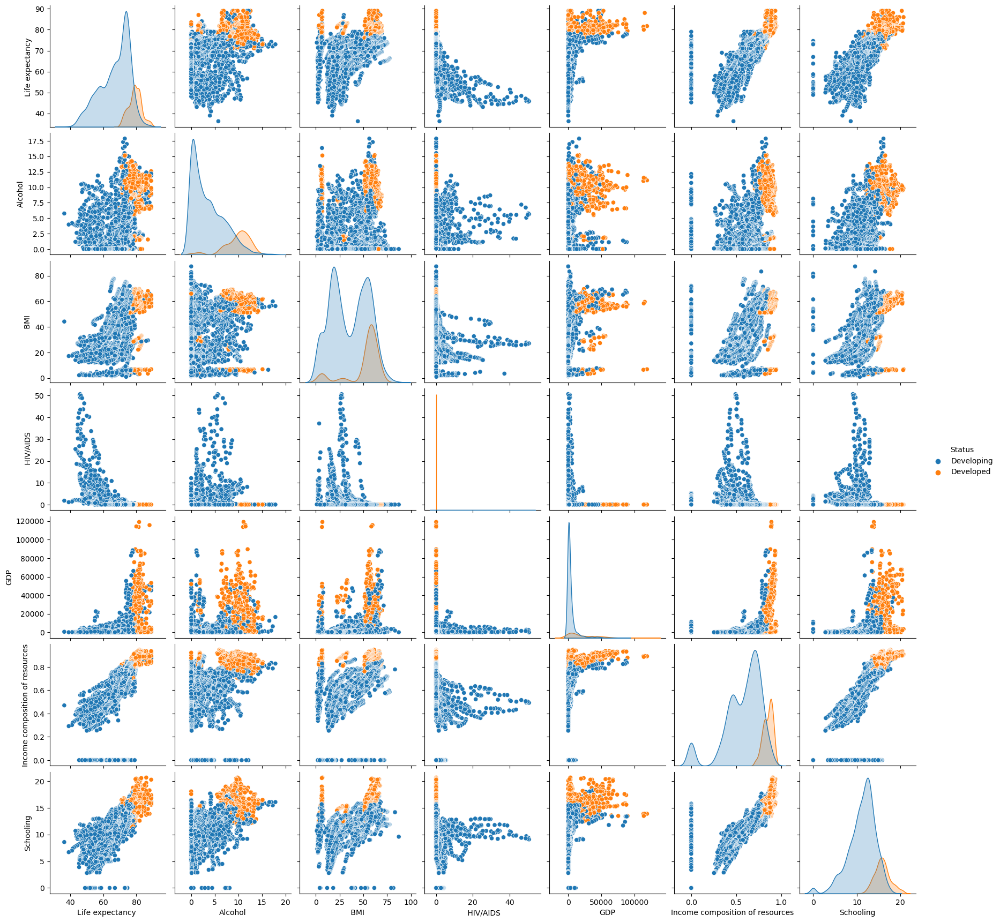

In [643]:
life_exp_pairplot = life_exp_heatmap.drop(['Population', 'Total expenditure', 'Measles ', 'Hepatitis B'], axis=1)
sns.pairplot(life_exp_pairplot, hue='Status')

#### main dataset

In [4]:
countries = df[['Country', 'Death year', 'Age of death']].dropna()

## cleaning up countries
countries['Country'] = countries.apply(lambda row: row['Country'].split(';')[0], axis=1)
countries_count_dict = countries['Country'].value_counts().to_dict()

## remove count < 20
count_small = [key for key, val in countries_count_dict.items() if val < 50]
countries = countries.drop(countries[countries['Country'].isin(count_small)].index)
countries['Country'].value_counts()

## Merging country names (eg. 'United Kingdom', 'Kingdom of Great Britain')

replace_country_dict = {'United States of America':'US', 'Kingdom of France':'France', 'Nazi Germany':'Germany',
                       'Kingdom of the Netherlands':'Netherlands', 'Czech Republic':'CZ', 
                        'German Empire':'Germany', 'Kingdom of Poland':'Poland','Duchy of Milan':'Italy', 
                        'Kingdom of England':'United Kingdom', 'Grand Duchy of Tuscany':'Italy',
                        'Republic of Florence':'Italy', 'Austria-Hungary':'Austria', 
                        'Kingdom of Great Britain':'United Kingdom', 
                        'United Kingdom of Great Britain and Ireland':'United Kingdom',
                        'Kingdom of Portugal':'Portugal', 'Russian Empire':'Russian Federation', 'British Raj':'United Kingdom',
                        'Austrian Empire':'Austria', 'Kingdom of Italy':'Italy', 'Kingdom of Sardinia':'Italy',
                        'Republic of Venice':'Venice', 'Russian Soviet Federative Socialist Republic':'Russian Federation',
                        'German Democratic Republic':'Germany', 'Papal States':'Italy', 'Kingdom of Prussia':'Germany', 
                        'Southern Netherlands':'Netherlands', 'Kingdom of Scotland':'United Kingdom', 'Scotland':'United Kingdom',
                        'Grand Duchy of Finland':'Finland', 'Ottoman Empire':'Turkey', 'Dutch Republic':'Germany',
                        "People's Republic of China":'China', 'Wales':'United Kingdom', 'Republic of Geneva':'Switzerland', 
                        'German Confederation':'Germany', 'Tang Empire':'China', 'Eastern Han Dynasty':'China', 
                        'Song dynasty':'China', 'Yuan dynasty':'China', 'Ming dynasty':'China',
                        'Democratic Republic of the Congo':'Congo, Democratic Republic of', 'Tsardom of Russia':'Russian Federation',
                        'ancient Rome':'Romania', 'Qing dynasty':'China', 'Puerto Rico':'US', 'Joseon':'Korea, North', 
                        'South Korea':'Korea, South', 'Republic of China (1912–1949)':'China', 'Taiwan':'China', 
                        'Polish–Lithuanian Commonwealth':'Poland', 'Kingdom of Naples':'Italy', 'Crown of Castile':'Spain',
                        'Weimar Republic':'Germany', 'Kingdom of Romania':'Romania', 'Kingdom of Bavaria':'Germany',
                        'England':'United Kingdom', 'Irish Free State':'Ireland', 'Northern Ireland':'Ireland',
                        'Kingdom of Hawaiʻi':'US', 'Great Britain':'United Kingdom', 'British people':'United Kingdom',
                        'Americans':'US', 'Republic of the Congo':'Congo', 'Canadians':'Canada', 'North Korea':'Korea, North',
                        'Italians':'Italy', 'Russia':'Russian Federation', 'Soviet Union':'Russian Federation', 
                        'Holy Roman Empire':'Romania', 'Venice':'Italy', 'Kingdom of Ireland':'Ireland', 'German Reich':'Germany',
                        'Kingdom of Hungary':'Hungary'
                       }

countries.replace({'Country':replace_country_dict},inplace=True)

In [5]:
## group by continents
continents_country_map = pd.read_csv('Countries-Continents.csv')
continents = countries.copy()
continents = continents.merge(continents_country_map, on='Country')

# continents_contemp = continents[continents['Death year'] > 1900]

# sort in order
order = continents_contemp.groupby('Continent').agg('mean').sort_values('Age of death', ascending=True).index.tolist()
order

NameError: name 'continents_contemp' is not defined

#### continents violin plot

In [760]:
import plotly.graph_objects as go
from plotly.colors import n_colors

np.random.seed(1)

data = []
for c in order:
    data.append(continents_data[continents_data['Continent'] == c]['Age of death'].tolist())
        
colors = n_colors('rgb(5, 10, 10)', 'rgb(200, 10, 10)', 6, colortype='rgb')

fig = go.Figure()
fig.update_layout(width=800, height=800)
fig.update_xaxes(title='Age of death')
    
for data_line, color, name in zip(data, colors, order):
    fig.add_trace(go.Violin(x=data_line, line_color=color, name=name, meanline_visible=True))

fig.update_traces(orientation='h', side='positive', width=3, points=False)
fig.update_layout(xaxis_showgrid=False, xaxis_zeroline=False)
fig.show()

In [593]:
import plotly.graph_objects as go
from plotly.colors import n_colors
np.random.seed(1)

colors = n_colors('rgb(5, 200, 200)', 'rgb(200, 10, 10)', 6, colortype='rgb')

fig = go.Figure()
fig.update_layout(width=800, height=800)


for step in np.arange(1900, 2020, 20):
    continents_data = continents[(continents['Death year']<step)&(continents['Death year']>(step-20))]
    continents_data = continents_data[continents_data['Age of death'] < 100]
    data = []
    for c in order:
        data.append(continents_data[continents_data['Continent'] == c]['Age of death'].tolist())
    
    for data_line, color, name in zip(data, colors, order):
        fig.add_trace(go.Violin(x=data_line, line_color=color, name=name, meanline_visible=True, visible=False))

# Make most recent trace visible
for i in range(-6,0):
    fig.data[i].visible = True
    
# Create and add slider
steps = []
for i in range(len(fig.data)//6):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": "Slider switched to step: " + str(1900+i*20-20) + ' - '+ str(1900+i*20)
              }],  # layout attribute
    )
    for j in range(i*6, i*6+6):
        step["args"][0]["visible"][j] = True  # Toggle i'th trace to "visible"
        steps.append(step)

sliders = [dict(
    active=10,
    currentvalue={"prefix": "Frequency: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)

fig.update_traces(orientation='h', side='positive', width=3, points=False)
fig.update_layout(xaxis_showgrid=False, xaxis_zeroline=False)
fig.show()

#### continents line plot

In [6]:
from scipy.interpolate import interp1d

continents_line_data = continents[continents['Death year'] >= 1900]
continents_line_data = continents_line_data.drop('Country', axis=1).groupby(['Continent', 'Death year']).agg('mean')
continents_line_data = continents_line_data.reset_index()
continents_line_data = continents_line_data.pivot(index='Death year', columns='Continent', values='Age of death')

# fill nan values and smooth
for continent in continents_line_data.columns.tolist():
    continents_line_data[continent] = continents_line_data[continent].interpolate(method="polynomial", order=2)
    continents_line_data[continent + '_smoothed']= continents_line_data[continent].rolling(window = 15, center=True, win_type='gaussian').mean(std=8)
    
continents_line_data['death year'] = continents_line_data.index.tolist()

In [7]:
source = ColumnDataSource(continents_line_data)

TOOLTIPS = [ ('Asia: ', '@{Asia}{0.0}'), ('Africa: ', '@{Africa}{0.0}'), ('Europe: ', '@{Europe}{0.0}'),
           ('North America: ', '@{North America}{0.0}'), ('South America: ', '@{South America}{0.0}'), 
            ('Oceania: ', '@{Oceania}{0.0}')]
hover = HoverTool(names=['cont_hover'])

p = figure(plot_width=800, plot_height=600, title="Mean life expectancy across continents", 
           x_axis_label='Year', y_axis_label='Age of death (mean)', tools=[hover], tooltips=TOOLTIPS)

# p.circle('Year', 'Dept C', size=10, name='Dept C', source=source, color='green')
# p.line('death year', 'Africa', line_width=2, color='green', legend_label='africa', source=source, name='cont_hover')
africa = p.line('death year', 'Africa_smoothed', line_width=2, color='#395144', legend_label='africa', source=source, name='cont_hover')
asia = p.line('death year', 'Asia_smoothed', line_width=2, color='#AA8B56', legend_label='asia', source=source, name='cont_hover')
eur = p.line('death year', 'Europe_smoothed', line_width=2, color='#1746A2', legend_label='europe', source=source, name='cont_hover')
northa = p.line('death year', 'North America_smoothed', line_width=2, color='#FF884B', legend_label='north america', source=source, name='cont_hover')
oceania = p.line('death year', 'Oceania_smoothed', line_width=2, color='#150050', legend_label='oceania', source=source, name='cont_hover')
southa = p.line('death year', 'South America_smoothed', line_width=2, color='#FF577F', legend_label='south america', source=source, name='cont_hover')

p.legend.click_policy="mute"
africa.muted, asia.muted, eur.muted, northa.muted, oceania.muted = True, True, True, True, True

ww1 = p.vbar(x=[1916], width=4, bottom=0, top=[80], color='firebrick', alpha=0.3, muted_alpha=0.0, legend_label='WW1')
ww1.muted=True
ww2 = p.vbar(x=[1942], width=6, bottom=0, top=[80], color='firebrick', alpha=0.3, muted_alpha=0.0, legend_label='WW2')
ww2.muted=True

p.legend.location="bottom_right"
show(p)

#### other plots

In [562]:
import plotly.express as px

gapminder = px.data.gapminder()

fig = px.scatter(gapminder, x="gdpPercap", y="lifeExp", animation_frame="year", animation_group="country",
           size="pop", color="continent", hover_name="country",
           log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90])

# fig = px.scatter(life_exp, x="GDP", y="Life expectancy ", animation_frame="Year", animation_group="Country",
#            size="Population", color="Country", hover_name="Country",
#            log_x=False, size_max=55, range_x=[100,60000], range_y=[25,90])

fig["layout"].pop("updatemenus") # optional, drop animation buttons
fig.show()

In [576]:
## separate Americas into north and south
gapminder_americas = gapminder[gapminder['continent'] == 'Americas']
gapminder_nonam = gapminder[gapminder['continent'] != 'Americas']

continents_country_map_americas = continents_country_map[continents_country_map['Continent'].isin(['North America', 'South America'])]
gapminder_americas = gapminder_americas.merge(continents_country_map_americas, left_on= 'country', right_on='Country')
gapminder_americas = gapminder_americas.drop(['continent', 'Country'], axis=1).rename(columns = {'Continent':'continent'})
gapminder = pd.concat([gapminder_nonam, gapminder_americas], axis=0)

gapminder_cont = gapminder.drop(['country', 'iso_alpha', 'iso_num'], axis=1)
gapminder_cont = gapminder_cont.groupby(['continent', 'year']).agg({'pop':'sum', 'gdpPercap':'mean', 'lifeExp':'mean'})
gapminder_cont = gapminder_cont.reset_index()
gapminder_cont

In [585]:
fig = px.scatter(gapminder_cont, x="gdpPercap", y="lifeExp", animation_frame="year", 
            animation_group="continent",
           size="pop", color="continent", hover_name="continent",
           log_x=False, size_max=55, range_x=[1000,35000], range_y=[0,85])

fig["layout"].pop("updatemenus") # optional, drop animation buttons
fig.show()

### Age
- distribution
- life expectancy over time

In [657]:
hist_data['Age of death'].mean()

69.25725391334647

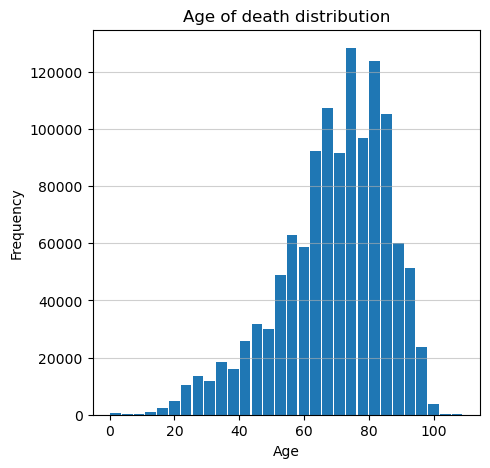

In [656]:
hist_data = df[['Death year', 'Age of death']].dropna()
hist_data = hist_data[hist_data['Age of death'] < 110]
plt.rcParams["figure.figsize"] = (5,5)
plt.hist(hist_data['Age of death'].tolist(), bins=30, rwidth=0.9)

plt.grid(axis='y', alpha=0.6)
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Age of death distribution')
plt.show() 

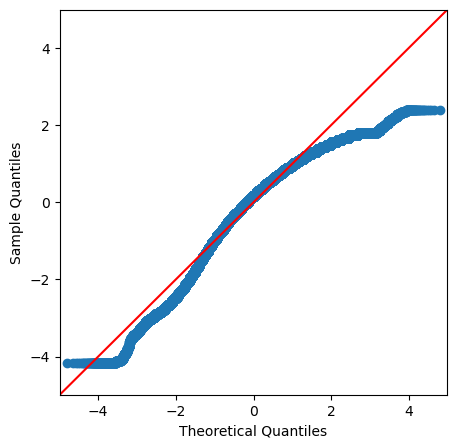

ShapiroResult(statistic=0.9635384678840637, pvalue=0.0)

In [619]:
## normality tests
from scipy.stats import norm, uniform
from statsmodels.graphics.gofplots import qqplot

qq_data = np.asarray(hist_data['Age of death'])
qqplot(qq_data, norm, fit=True, line='45')
plt.show()

from scipy.stats import shapiro
shapiro(qq_data)

In [31]:
age_df = df[['Death year', 'Age of death']].dropna().sort_values('Death year', ascending=True)

# life expectancy over time (from the 1500s)
age_df = age_df[age_df['Death year'] > 1500]
age_df = age_df.groupby('Death year').agg('mean')
age_df['death year'] = age_df.index.tolist()

source = ColumnDataSource(age_df)
TOOLTIPS = [('year', '@{death year}{0.0}'), ('mean life expectancy', '@{Age of death}{0.0}')]
hover = HoverTool(names=['age'])

smoothed_age = age_df.rolling(window = 8, center=True, win_type='gaussian').mean(std=8)
p = figure(plot_width=1000, plot_height=800, title="Mean life expectancy", x_axis_label='Year', y_axis_label='Age of death (mean)',
          tools=[hover], tooltips=TOOLTIPS) #, tools=[hover]

p.line(age_df.index.to_list(), smoothed_age['Age of death'].to_list()[2:-2] #age_df['Age of death'].tolist()
       , line_width=2, color='green', legend='smoothed')

p.line('death year', 'Age of death', line_width=2, color='black', alpha=0.2, source=source, name='age',
      legend='original data')

ww1 = p.vbar(x=[1916], width=4, bottom=0, top=[80], color='firebrick', alpha=0.3, muted_alpha=0.0, legend_label='WW1')
ww1.muted=True
ww2 = p.vbar(x=[1942], width=6, bottom=0, top=[80], color='firebrick', alpha=0.3, muted_alpha=0.0, legend_label='WW2')
ww2.muted=True

source_lab = ColumnDataSource(data=dict(year=[1501, 2020],
                                        y=[50, 80.2],
                                        label_lifeexp = ['51.7', '80.2']))

labels = LabelSet(x='year', y='y', text='label_lifeexp',
              x_offset=0, y_offset=10, source=source_lab, render_mode='canvas', text_color='blue')

p.add_layout(labels)

p.legend.click_policy="mute"
p.legend.location="top_left"

show(p)

## to do: add text labels for 2020, ww1, ww2

### Manner of death
 - changes over years
 - relationship with occupation

In [724]:
manner_of_death_comtemp = manner_of_death[manner_of_death['Death year'] >= 1900][['Death year', 'Manner of death']]
manner_of_death_comtemp = manner_of_death_comtemp.sort_values('Death year', ascending=True) #.groupby(['Death year'])
manner_of_death_comtemp = manner_of_death_comtemp.groupby(['Death year', 'Manner of death']).size().reset_index(name = 'count')
manner_of_death_comtemp = manner_of_death_comtemp.pivot(index=['Death year'], columns = ['Manner of death'], values='count')
manner_of_death_comtemp = manner_of_death_comtemp.fillna(0)

In [716]:
## interactive stacked area chart for changes in manner of death over years

manner_list = manner_of_death_comtemp.columns.tolist()
N = len(manner_list)
# df = pd.DataFrame(np.random.randint(10, 100, size=(15, N))).add_prefix('death')

p = figure(x_range=(1900, 2022), y_range=(0, 1500))
p.grid.minor_grid_line_color = '#eeeeee'

# names = [f"y{i}" for i in range(N)]
p.varea_stack(stackers=manner_list, x='Death year', color=brewer['Spectral'][N], legend_label=manner_list, source=manner_of_death_comtemp)

p.legend.orientation = "vertical"
p.legend.location="top_left"
p.legend.background_fill_color = "#fafafa"

show(p)

#### normalized

In [718]:
manner_of_death_comtemp = manner_of_death_comtemp['']


accident                       0
capital punishment             0
homicide                       0
natural causes                 0
others                         0
suicide                        0
war                            0
accident_smoothed              9
capital punishment_smoothed    9
homicide_smoothed              9
natural causes_smoothed        9
others_smoothed                9
suicide_smoothed               9
war_smoothed                   9
total_smoothed                 9
Death year                     0
dtype: int64

In [725]:
manner_of_death_comtemp['total'] = manner_of_death_comtemp.sum(axis=1)
manner_of_death_comtemp = manner_of_death_comtemp.reset_index(drop=True)
manner_of_death_comtemp.columns.name = ''
for col in manner_of_death_comtemp.columns.to_list():
    manner_of_death_comtemp[col] = manner_of_death_comtemp.apply(lambda row: row[col]/row['total'] , axis=1)
    manner_of_death_comtemp[col] = manner_of_death_comtemp[[col]].rolling(window = 10, center=True, win_type='gaussian').mean(std=8)
manner_of_death_comtemp['Death year'] = [i for i in range(1900, 2021)]
manner_of_death_comtemp = manner_of_death_comtemp.drop('total', axis=1)
manner_of_death_comtemp

,accident,capital punishment,homicide,natural causes,others,suicide,war,Death year
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1900
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1901
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1902
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1903
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1904
...,...,...,...,...,...,...,...,...
116,0.064906,0.005802,0.089245,0.780011,0.003498,0.055325,0.001212,2016
117,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017
118,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018
119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019


In [741]:
## interactive stacked area chart for changes in manner of death over years

manner_list = manner_of_death_comtemp.columns.tolist()
manner_list.remove('Death year')
manner_list = ['natural causes', 'accident', 'capital punishment', 'homicide', 'suicide', 'war', 'others']
N = len(manner_list)
# df = pd.DataFrame(np.random.randint(10, 100, size=(15, N))).add_prefix('death')

source = ColumnDataSource(manner_of_death_comtemp)

TOOLTIPS = [('natural causes', '@{natural causes}{0.00}'), ('accident', '@{accident}{0.00}'), ('homicide', '@{homicide}{0.00}'),
           ('capital punishment', '@{capital punishment}{0.00}'), ('suicide', '@{suicide}{0.00}'), 
            ('war', '@{war}{0.00}'), ('others', '@{others}{0.00}')]
hover = HoverTool(names=['phover'])

p = figure(x_range=(1907, 2016), y_range=(0, 1), x_axis_label='Year', y_axis_label='Proportion of deaths',
          tools=[hover], tooltips=TOOLTIPS)
p.grid.minor_grid_line_color = '#eeeeee'

# names = [f"y{i}" for i in range(N)]
p.varea_stack(stackers=manner_list, x='Death year', color=Set1[N], legend_label=manner_list, source=source, name='phover')

p.legend.orientation = "vertical"
p.legend.location="bottom_right"
p.legend.background_fill_color = "#fafafa"

show(p)

In [739]:
## interactive stacked area chart for changes in manner of death over years

manner_list = manner_of_death_comtemp.columns.tolist()
manner_list.remove('Death year')
manner_list = ['natural causes', 'accident', 'capital punishment', 'homicide', 'suicide', 'war', 'others']
N = len(manner_list)
# df = pd.DataFrame(np.random.randint(10, 100, size=(15, N))).add_prefix('death')

p = figure(x_range=(1907, 2016), y_range=(0, 1), x_axis_label='Year', y_axis_label='Proportion of deaths')
p.grid.minor_grid_line_color = '#eeeeee'

# names = [f"y{i}" for i in range(N)]
p.varea_stack(stackers=manner_list, x='Death year', color=Set1[N], legend_label=manner_list, source=manner_of_death_comtemp)

p.legend.orientation = "vertical"
p.legend.location="bottom_right"
p.legend.background_fill_color = "#fafafa"

show(p)

In [ ]:
smoothed_age_m = male_df.rolling(window = 10, center=True, win_type='gaussian').mean(std=8)

In [746]:
manner_of_death_comtemp['Death year'] = [i for i in range(1900, 2021)]
source = ColumnDataSource(manner_of_death_comtemp[:-1])

TOOLTIPS = [('natural causes', '@{natural causes}{0.0}'), ('accident', '@{accident}{0.0}'), ('homicide', '@{homicide}{0.0}'),
           ('capital punishment', '@{capital punishment}{0.0}'), ('suicide', '@{suicide}{0.0}'), 
            ('war', '@{war}{0.0}'), ('others', '@{others}{0.0}')]
hover = HoverTool(names=['causes'])


p = figure(plot_width=1000, plot_height=800, title="Manner of death over time", x_axis_label='Year', y_axis_label='Proportion of deaths'
        , tools=[hover], tooltips=TOOLTIPS)
p.y_range = Range1d(0, 1)

p.line(x='Death year', y='natural causes'
       , line_width=2, color='red', legend='Natural causes', name='causes', source=source)
p.line(x='Death year', y='accident'
       , line_width=2, color='#5F9DF7', legend='Accident', name='causes', source=source)
p.line(x='Death year', y='capital punishment'
       , line_width=2, color='green', legend='Capital punishment', name='causes', source=source)
p.line(x='Death year', y='suicide'
       , line_width=2, color='orange', legend='Suicide', name='causes', source=source)
p.line(x='Death year', y='war'
       , line_width=2, color='#FFDE00', legend='War', name='causes', source=source)
p.line(x='Death year', y='homicide'
       , line_width=2, color='purple', legend='Homicide', name='causes', source=source)
p.line(x='Death year', y='others'
       , line_width=2, color='#876445', legend='Others', name='causes', source=source)


ww1 = p.vbar(x=[1916], width=4, bottom=0, top=[80], color='firebrick', alpha=0.3, muted_alpha=0.0, legend_label='WW1')
ww1.muted=True
ww2 = p.vbar(x=[1942], width=6, bottom=0, top=[80], color='firebrick', alpha=0.3, muted_alpha=0.0, legend_label='WW2')
ww2.muted=True

p.legend.click_policy="mute"
p.legend.location="top_left"

show(p)

/Users/anyiwang/miniforge3/envs/basic_env/lib/python3.8/site-packages/bokeh/util/deprecation.py:75: BokehDeprecationWarning:

'legend' keyword is deprecated, use explicit 'legend_label', 'legend_field', or 'legend_group' keywords instead

/Users/anyiwang/miniforge3/envs/basic_env/lib/python3.8/site-packages/bokeh/util/deprecation.py:75: BokehDeprecationWarning:

'legend' keyword is deprecated, use explicit 'legend_label', 'legend_field', or 'legend_group' keywords instead

/Users/anyiwang/miniforge3/envs/basic_env/lib/python3.8/site-packages/bokeh/util/deprecation.py:75: BokehDeprecationWarning:

'legend' keyword is deprecated, use explicit 'legend_label', 'legend_field', or 'legend_group' keywords instead

/Users/anyiwang/miniforge3/envs/basic_env/lib/python3.8/site-packages/bokeh/util/deprecation.py:75: BokehDeprecationWarning:

'legend' keyword is deprecated, use explicit 'legend_label', 'legend_field', or 'legend_group' keywords instead

/Users/anyiwang/miniforge3/envs/basic_env/li

#### line chart interactive

### others

In [421]:
manner_of_death = df[df['Manner of death'].notna()]

In [423]:
## data cleaning
manner_of_death['additional info on death'] = manner_of_death.apply(lambda row: row['Manner of death'].split(';')[1:] if len(row['Manner of death'].split(';')) > 1 else row['Manner of death'], 
                                            axis=1)
manner_of_death['Manner of death'] = manner_of_death.apply(lambda row: row['Manner of death'].split(';')[0], 
                                            axis=1)
# manner_of_death['Manner of death'].unique().tolist()

/var/folders/xn/qxjmq8hj3ps62r2dfnf5s0nm0000gn/T/ipykernel_23322/317829901.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/xn/qxjmq8hj3ps62r2dfnf5s0nm0000gn/T/ipykernel_23322/317829901.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [424]:
# len(manner_of_death['Death year'].unique().tolist())
manner_of_death_comtemp = manner_of_death[manner_of_death['Death year'] >= 1900][['Death year', 'Manner of death']]
manner_of_death_comtemp = manner_of_death_comtemp.sort_values('Death year', ascending=True) #.groupby(['Death year'])
manner_of_death_comtemp = manner_of_death_comtemp.groupby(['Death year', 'Manner of death']).size().reset_index(name = 'count')
manner_of_death_comtemp = manner_of_death_comtemp.pivot(index=['Death year'], columns = ['Manner of death'], values='count')

## subset only a most common manners of death
top_manners = ['natural causes','suicide', 'accident', 'homicide',
                                                   'capital punishment', 'unnatural death', 'death in battle']
manner_of_death_comtemp = manner_of_death_comtemp[top_manners]
manner_of_death_comtemp = manner_of_death_comtemp.fillna(0)

In [425]:
manner_of_death_comtemp

Manner of death,natural causes,suicide,accident,homicide,capital punishment,unnatural death,death in battle
Death year,,,,,,,
1900.0,59.0,9.0,8.0,8.0,23.0,0.0,1.0
1901.0,57.0,16.0,10.0,10.0,5.0,0.0,0.0
1902.0,37.0,20.0,12.0,11.0,1.0,0.0,0.0
1903.0,46.0,15.0,13.0,8.0,4.0,0.0,1.0
1904.0,50.0,17.0,5.0,5.0,2.0,0.0,0.0
...,...,...,...,...,...,...,...
2016.0,811.0,53.0,61.0,42.0,7.0,0.0,1.0
2017.0,820.0,62.0,40.0,27.0,6.0,0.0,1.0
2018.0,832.0,64.0,53.0,47.0,9.0,3.0,1.0


In [34]:
## interactive stacked area chart for changes in manner of death over years

# manner_list = top_manners['Manner of death'].unique().tolist()
N = len(top_manners)
# df = pd.DataFrame(np.random.randint(10, 100, size=(15, N))).add_prefix('death')

p = figure(x_range=(1900, 2022), y_range=(0, 1500))
p.grid.minor_grid_line_color = '#eeeeee'

# names = [f"y{i}" for i in range(N)]
p.varea_stack(stackers=top_manners, x='Death year', color=brewer['Spectral'][N], legend_label=top_manners, source=manner_of_death_comtemp)

p.legend.orientation = "vertical"
p.legend.location="top_left"
p.legend.background_fill_color = "#fafafa"

show(p)

TODO: group some smaller manners of death into bigger groups (eg. world war + death of battle)

change palette to categorical
    
normalize data across years?

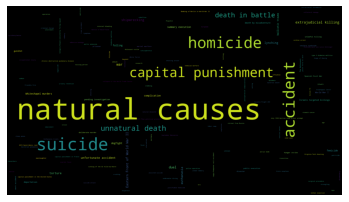

In [24]:
from wordcloud import WordCloud 

# cloud_data = manner_of_death.groupby(['Manner of death']).size().reset_index(name='Count').sort_values('Count', ascending = False)

cloud_data = manner_of_death['Manner of death'].value_counts().to_dict()
wc = WordCloud(width =1920, 
        height =1080, background_color= 'black').generate_from_frequencies(cloud_data)

plt.imshow(wc)
plt.axis('off')
plt.show()